# Setup

## Python Environment

In [1]:
import os
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
import xarray as xr
print('All packages imported.')

default_site = 'twp-C3'
seed = 42 # for reproducibility
print(f'Random seed set as {seed}.')

All packages imported.
Random seed set as 42.


In [2]:
# Set threshold of rainy events
prec_threshold = 0.1
print(f'Threshold of rainy event is {prec_threshold} mm/hr')

Threshold of rainy event is 0.1 mm/hr


In [3]:
# Forced library reload
%reload_ext autoreload
%autoreload 2
# %aimport utils

## Site Selection

In [4]:
site = widgets.Select(
    options=['sgp-C1', 'twp-C1', 'twp-C2', 'twp-C3'],
    value=default_site,
    rows=6,
    description='ARM Site:',
    disabled=False
)


def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        print(f"Switch site to {change['new']}")


site.layout.width = '175px'
site.observe(on_change)
display(site)

Select(description='ARM Site:', index=3, layout=Layout(width='175px'), options=('sgp-C1', 'twp-C1', 'twp-C2', …

In [5]:
product = widgets.Select(
    options=['armbeatm'],
    value='armbeatm',
    rows=1,
    description='Product:',
    disabled=False
)

def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        print(f"Switch site to {change['new']}")
              
product.layout.width = '175px'
product.observe(on_change)
display(product)

Select(description='Product:', layout=Layout(width='175px'), options=('armbeatm',), rows=1, value='armbeatm')

## Data Import

In [6]:
def site2stream(site, product):
    region, index = site.split('-')
    stream = region+product+index
    #print(f'Ready for data stream: {stream}')
    return stream


def get_save_file_path(file_name, stage=2):
    CURRENT_DIR = os.getcwd()
    DATA_DIR = f'{CURRENT_DIR}/../../data/stage-{stage}_cleaned'
    FILE_PATH = f'{DATA_DIR}/{file_name}'
    return FILE_PATH


def get_DS(mf):
    return xr.open_mfdataset(mf)

In [7]:
stream = site2stream(site=site.value, product=product.value)
file_name = f'{stream}_standard_dropped.cdf'
FILE_PATH = get_save_file_path(file_name)

DS = get_DS(FILE_PATH)
DS

<xarray.Dataset>
Dimensions:        (p: 37, time: 5470)
Coordinates:
  * time           (time) datetime64[ns] 2002-04-01T11:30:00 ... 2010-08-16T23:30:00
  * p              (p) float32 1000.0 975.0 950.0 925.0 ... 150.0 125.0 100.0
Data variables:
    prec_sfc_next  (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    prec_sfc       (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    T_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    rh_sfc         (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    u_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    v_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    p_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    T_p            (time, p) float32 dask.array<shape=(5470, 37), chunksize=(5470, 37)>
    rh_p           (time, p) float32 dask.array<shape=(5470, 37), chunksize=(5470, 37)>
    u_p            (tim

# Data Quality Control

## Data Visualization

### Instant Parameter Plots

In [8]:
from utils import plot_1d, plot_2d, binplot_prec

var_1d = [var for var in list(DS) if ('_sfc' in var)]
var_2d = [var for var in list(DS) if ('_p' in var)]
print(f'1-dim variables: {var_1d}')
print(f'2-dim variables: {var_2d}')

1-dim variables: ['prec_sfc_next', 'prec_sfc', 'T_sfc', 'rh_sfc', 'u_sfc', 'v_sfc', 'p_sfc']
2-dim variables: ['T_p', 'rh_p', 'u_p', 'v_p']


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


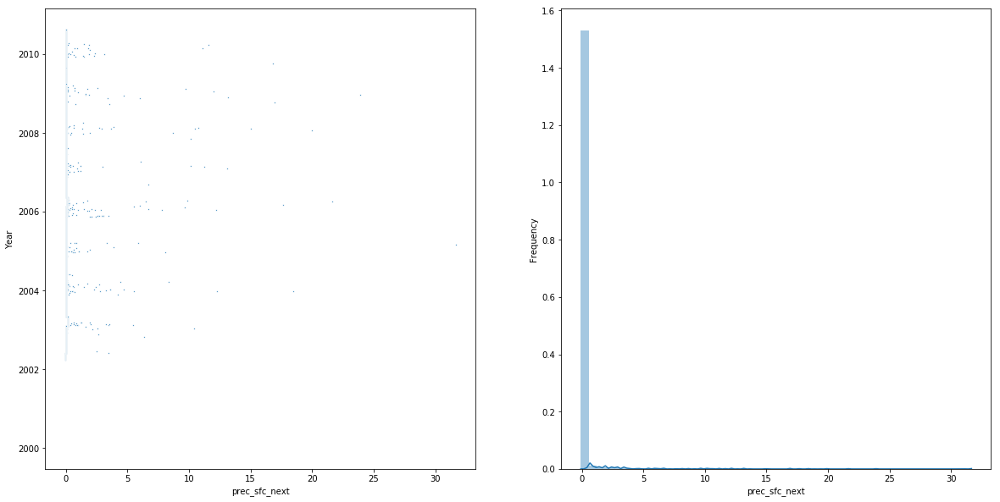

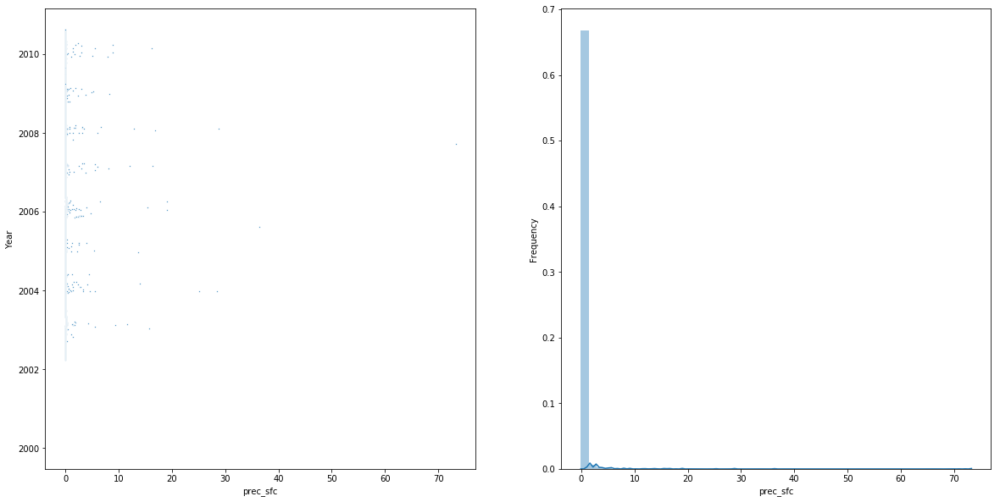

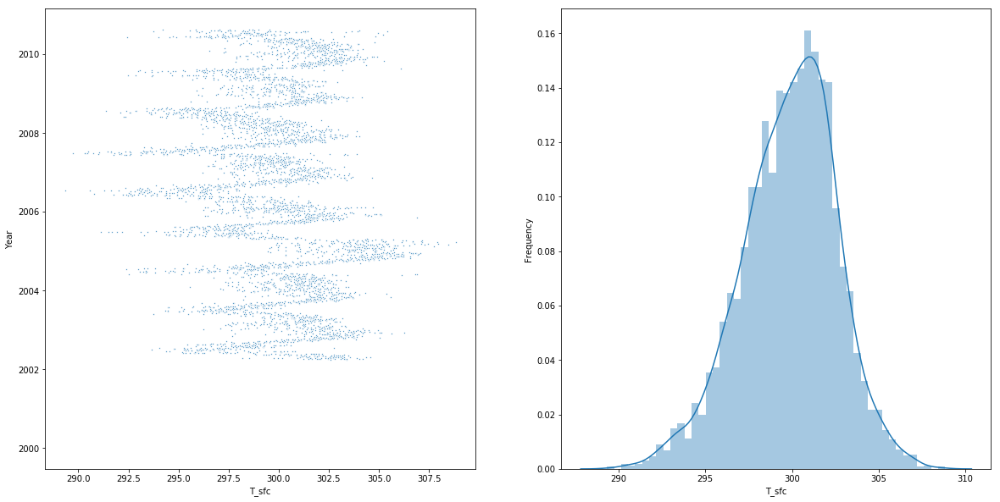

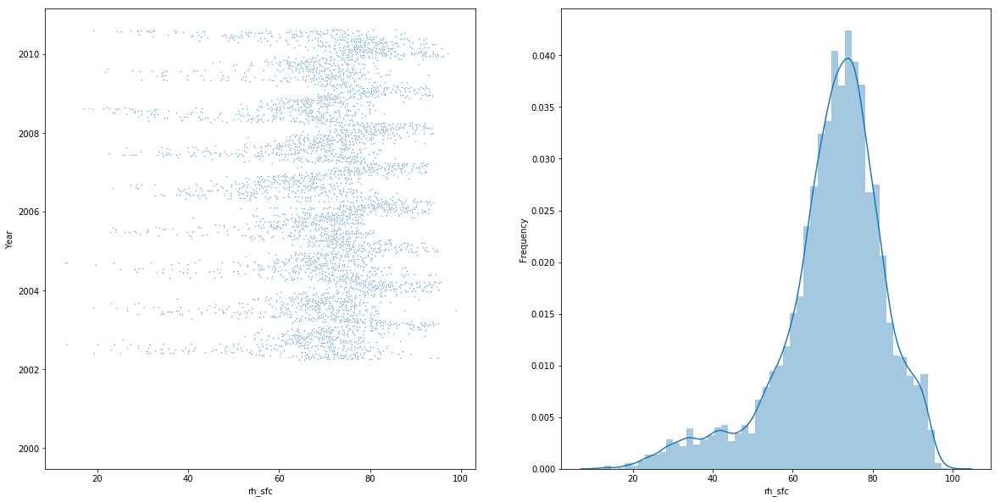

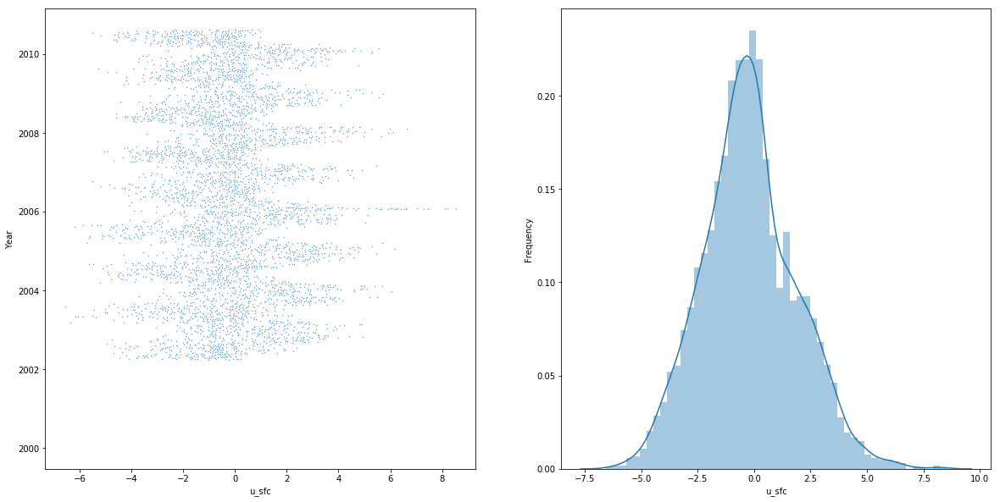

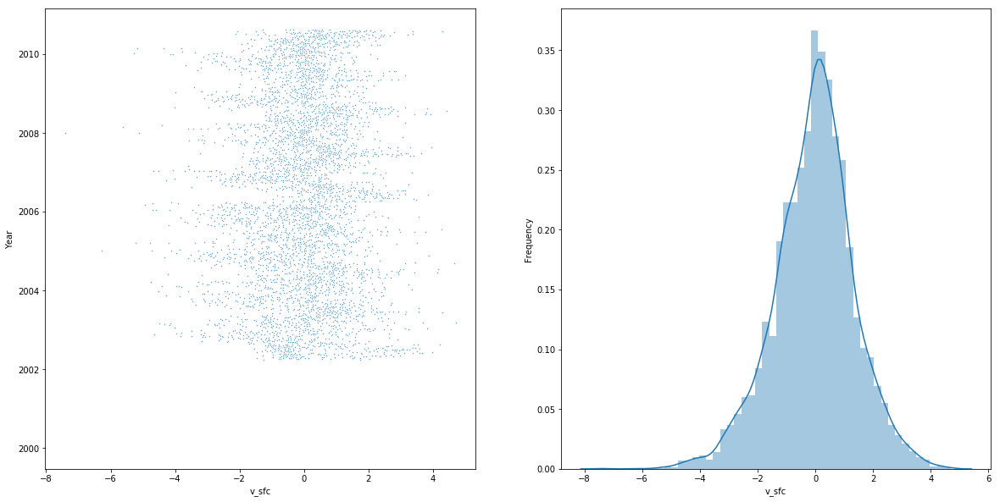

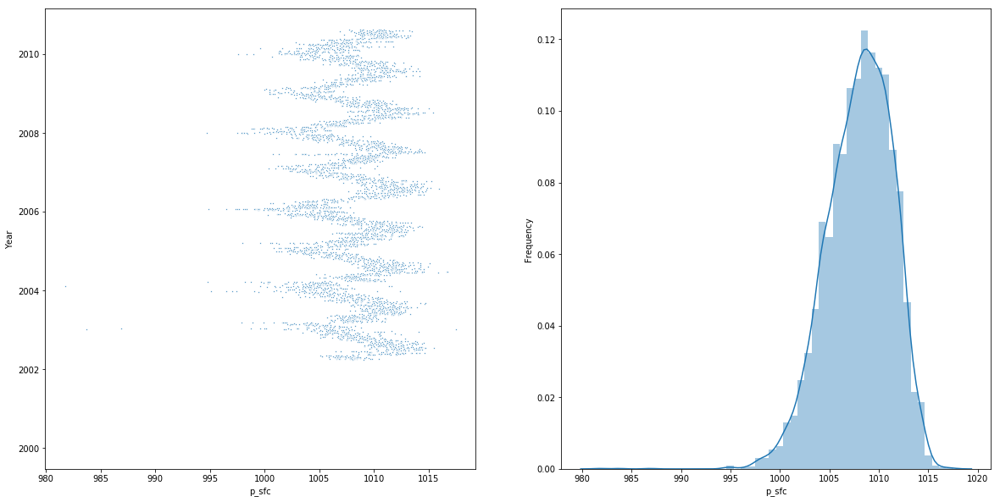

In [9]:
plot_1d(DS, var_1d)

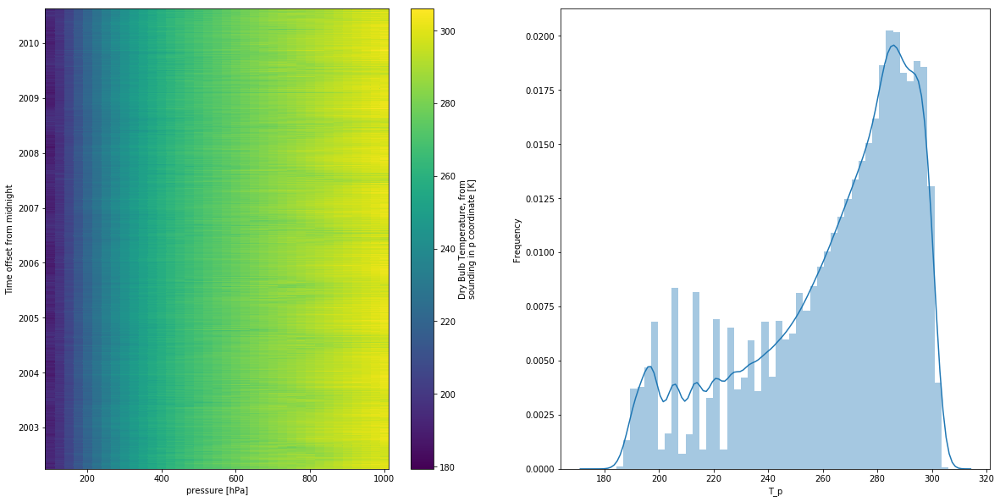

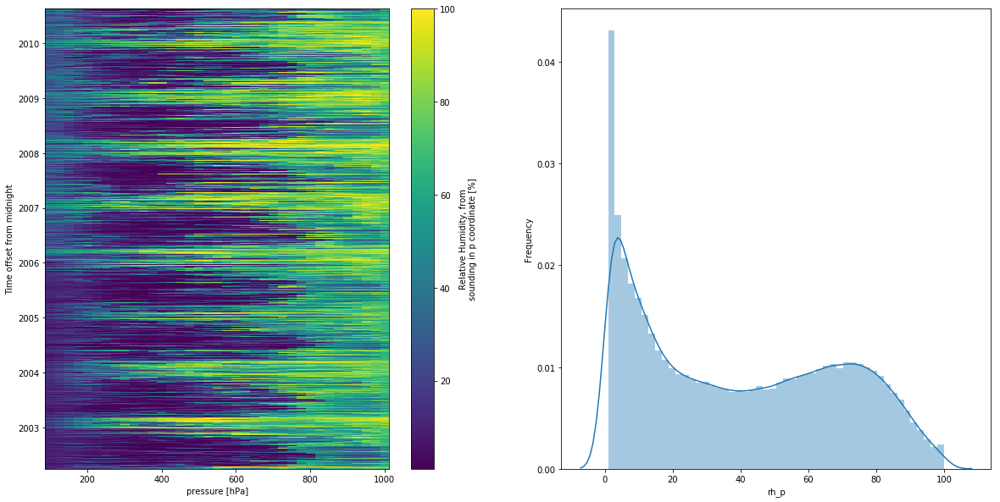

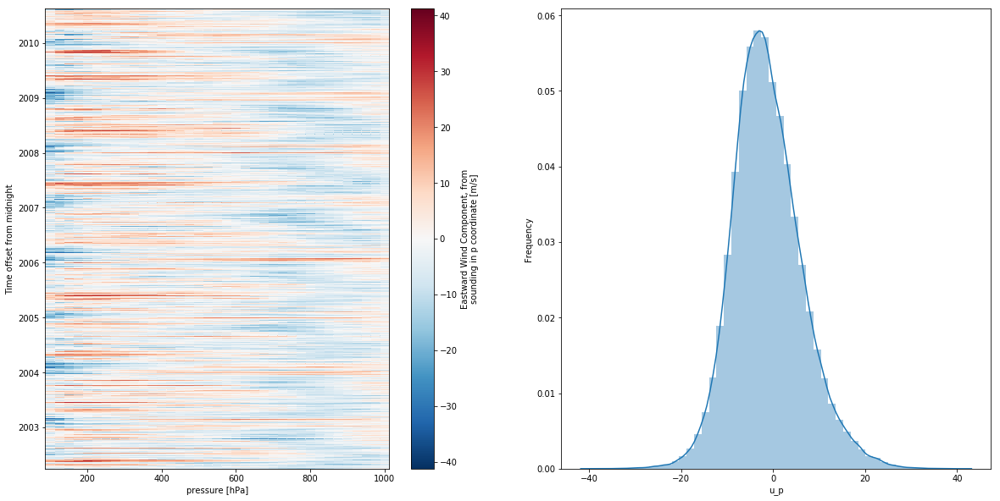

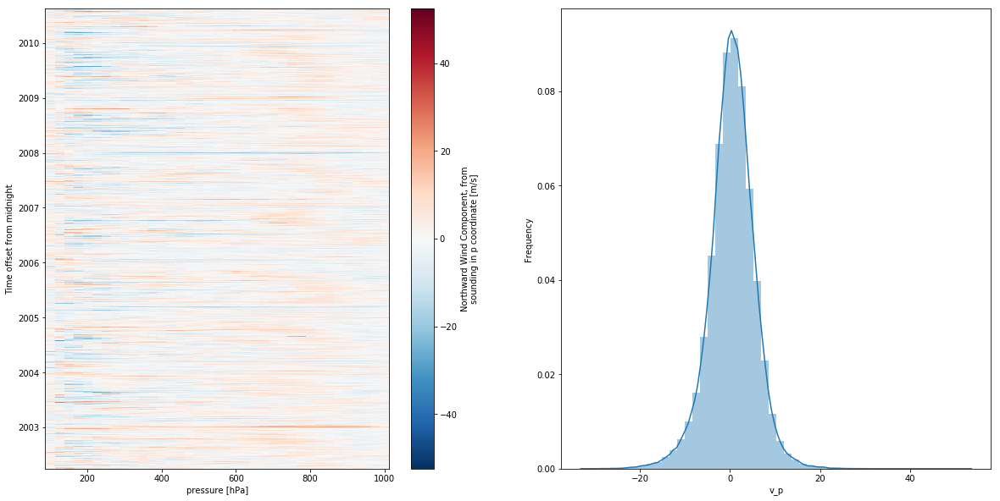

In [10]:
plot_2d(DS, var_2d)

### Correlation Plots

In [11]:
from utils import DS_flatten, plot_pair, plot_corr
DS_temp = DS_flatten(DS, var_1d, var_2d)
df = DS_temp.to_dataframe()

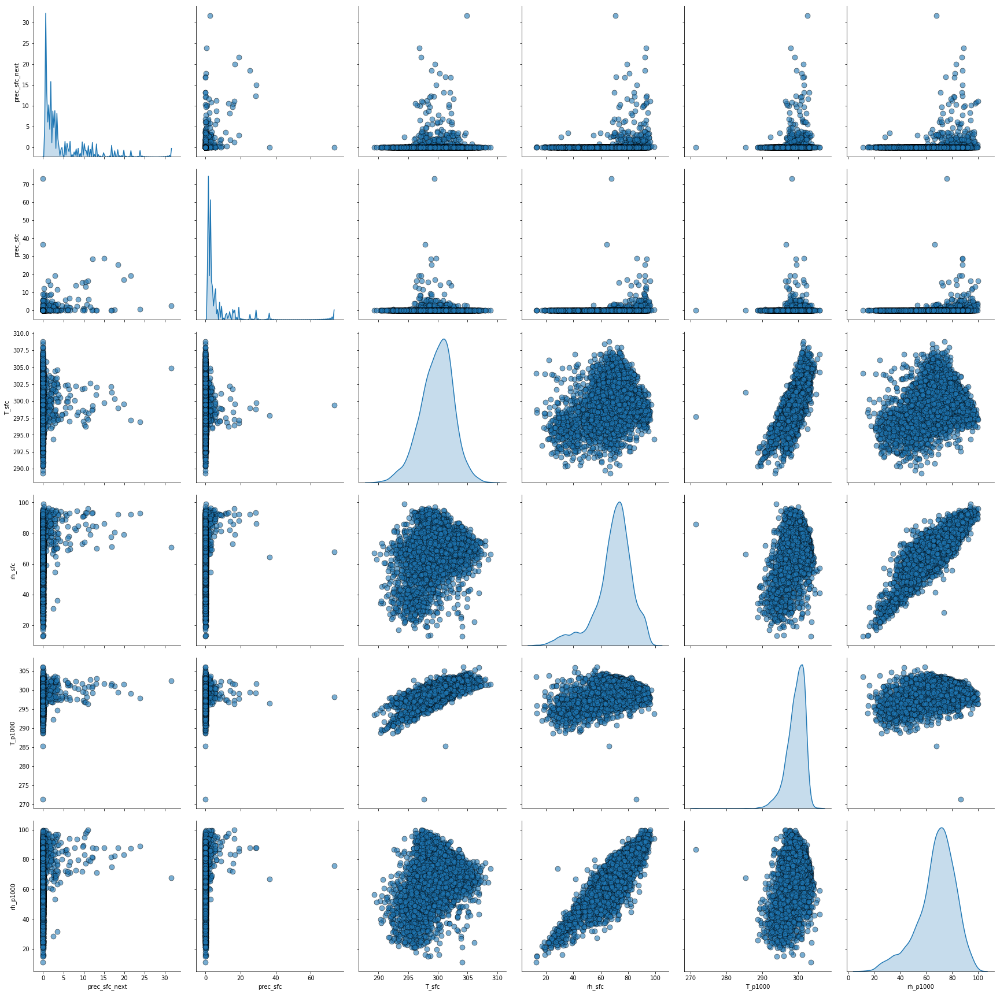

In [12]:
# Pair plot
plot_pair(df,
          cols_str=['prec_sfc_next', 'prec_sfc', 'T_sfc', 'rh_sfc', 'T_p1000', 'rh_p1000'])

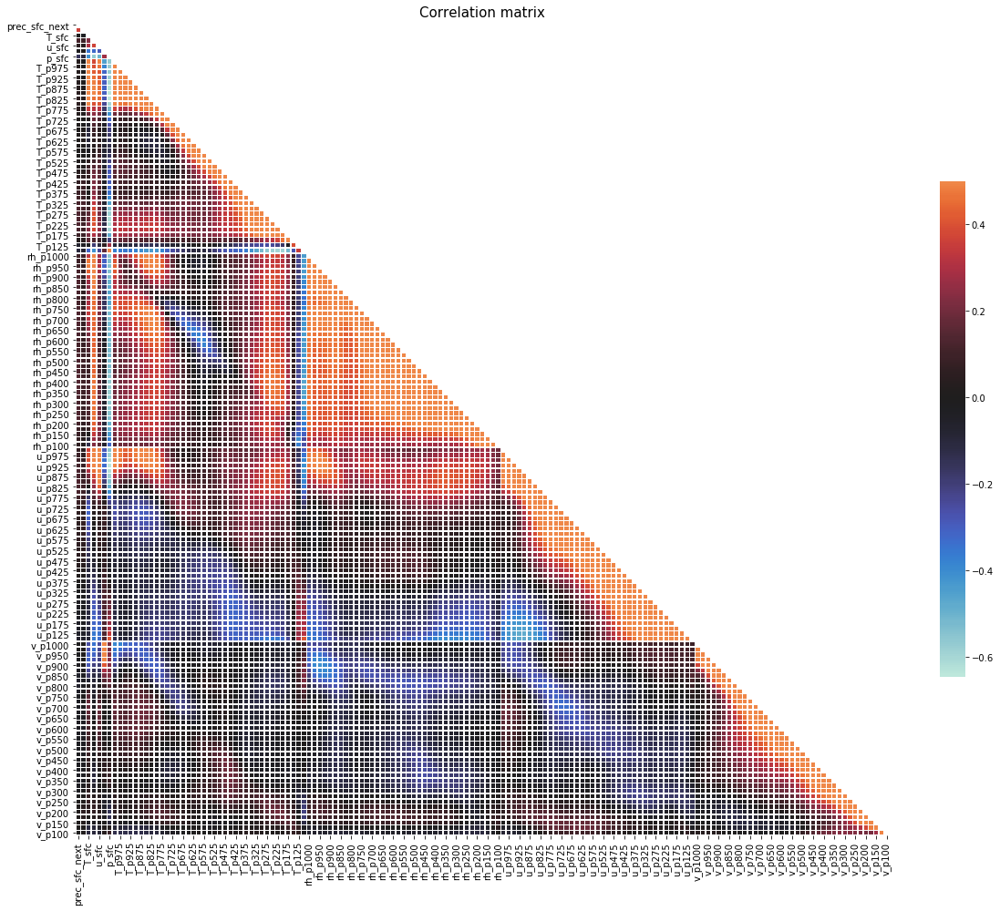

In [13]:
# Correlation Matrix
plot_corr(df)

### Flattened One-dimensional Parameter Plots

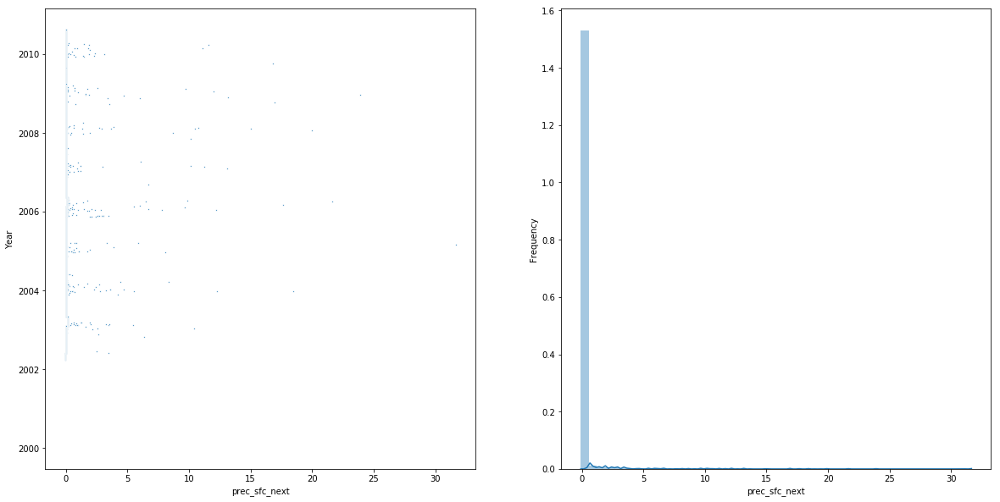

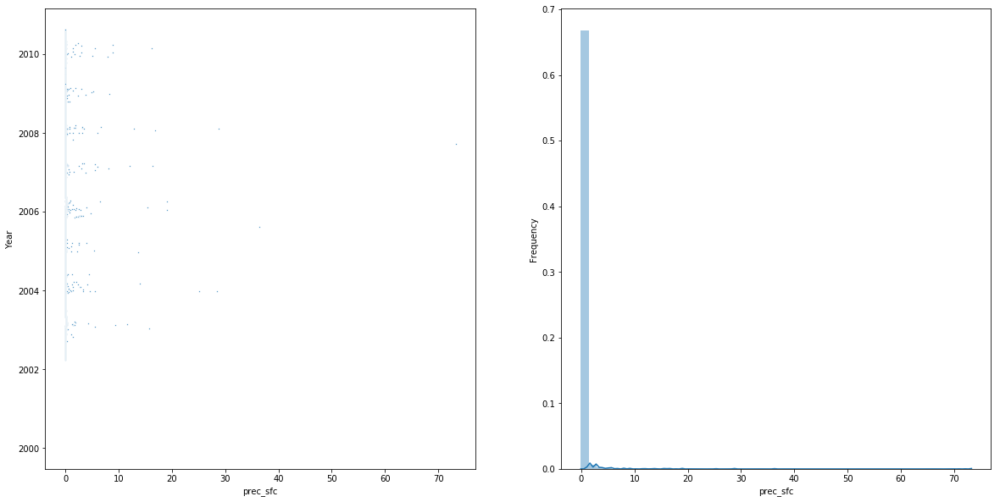

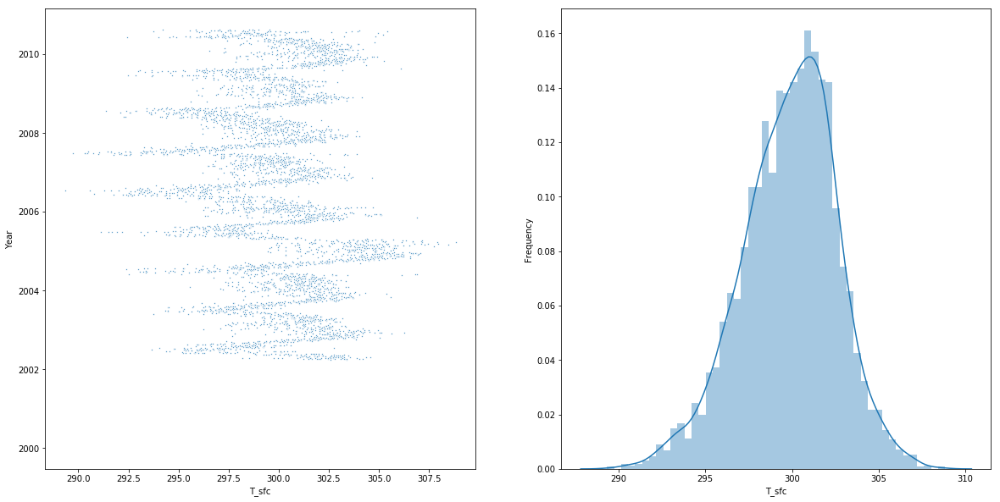

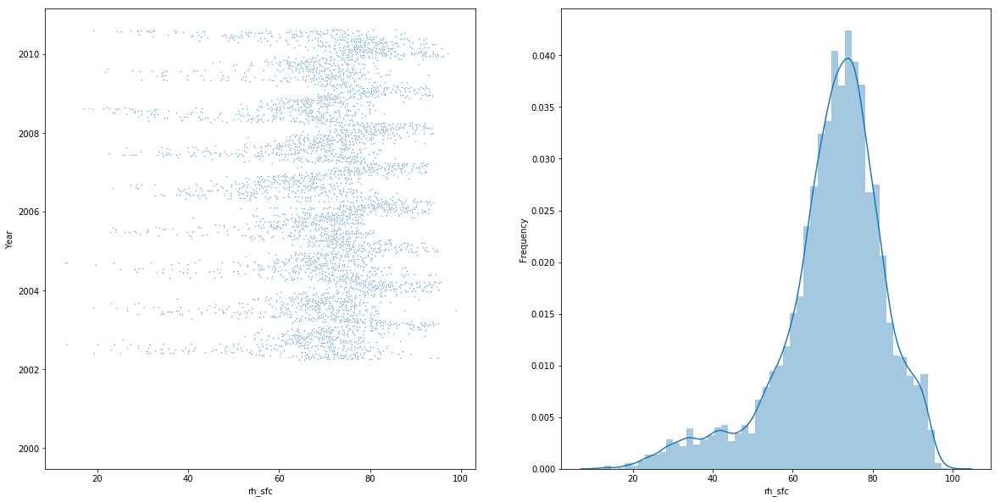

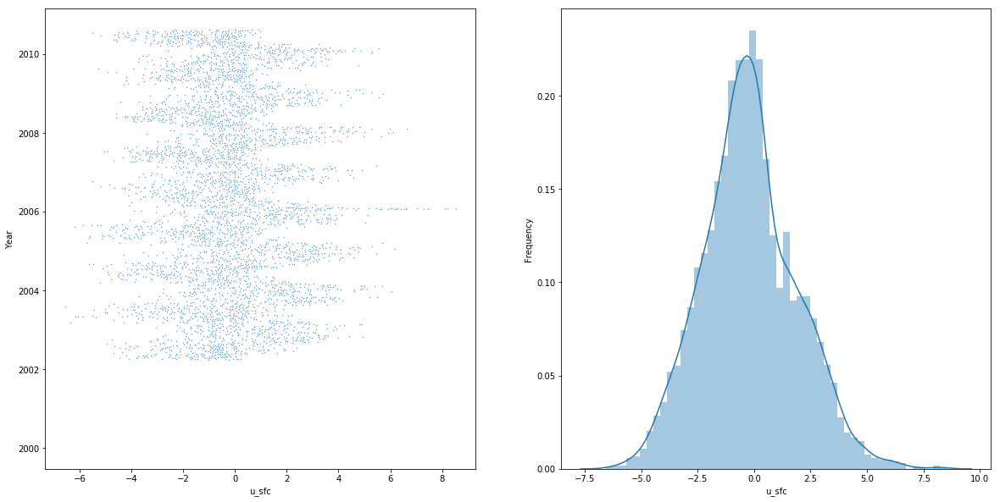

...

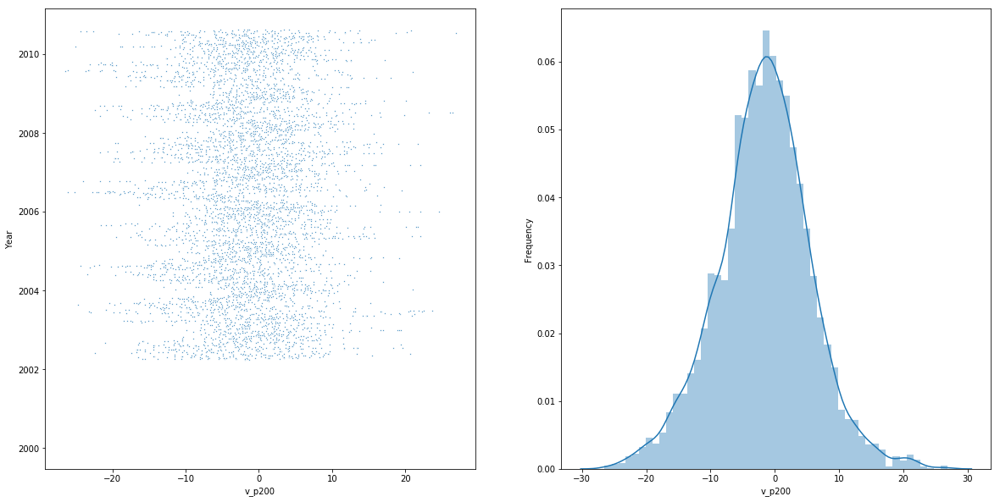

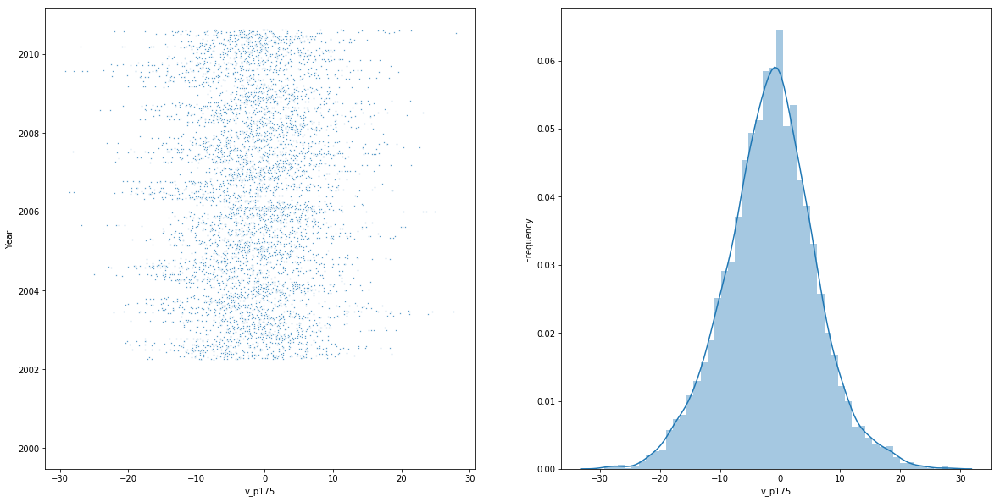

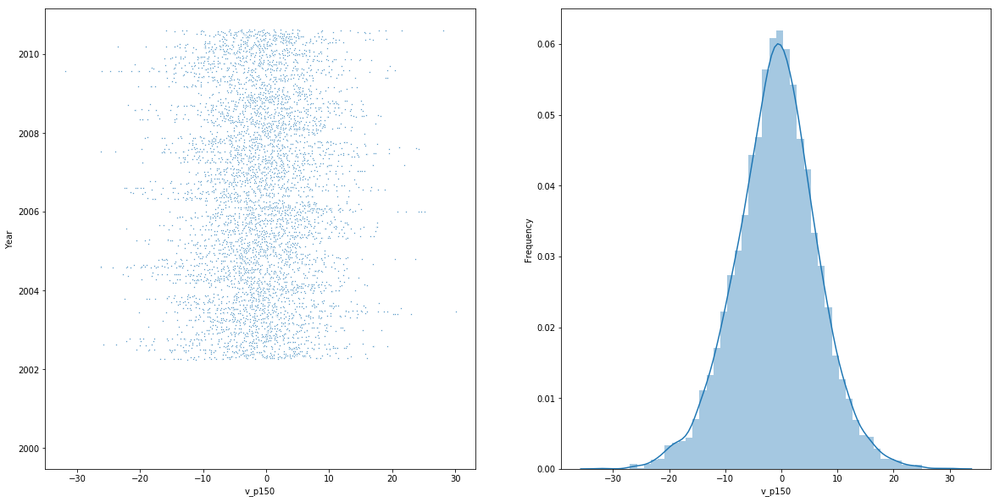

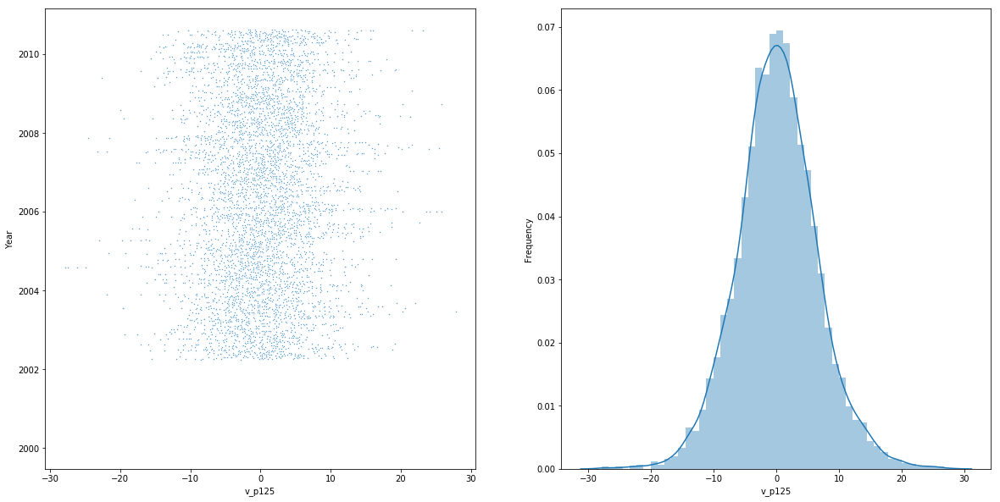

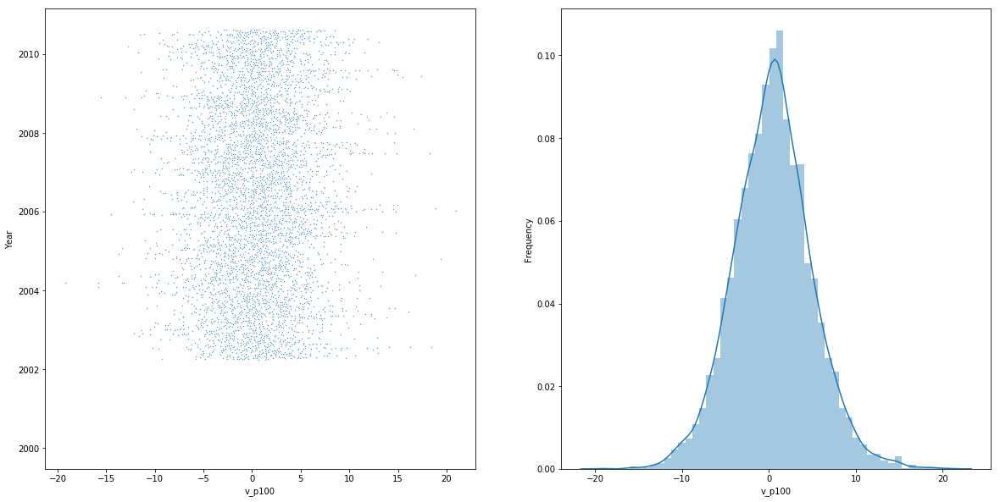

In [14]:
plot_1d(DS_temp, list(DS_temp))

## Data Filtering (DO NOT RUN TWICE)

In [15]:
from utils import abs_zscore_cut, abs_zscore, DS_mark_outliers, get_DS_plev

In [16]:
DS

<xarray.Dataset>
Dimensions:        (p: 37, time: 5470)
Coordinates:
  * time           (time) datetime64[ns] 2002-04-01T11:30:00 ... 2010-08-16T23:30:00
  * p              (p) float32 1000.0 975.0 950.0 925.0 ... 150.0 125.0 100.0
Data variables:
    prec_sfc_next  (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    prec_sfc       (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    T_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    rh_sfc         (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    u_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    v_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    p_sfc          (time) float32 dask.array<shape=(5470,), chunksize=(5470,)>
    T_p            (time, p) float32 dask.array<shape=(5470, 37), chunksize=(5470, 37)>
    rh_p           (time, p) float32 dask.array<shape=(5470, 37), chunksize=(5470, 37)>
    u_p            (tim

# Data Pre-processing

## Data Loading

In [8]:
str_y = list(DS)[0]
str_Xscalar = [var for var in list(DS)[1:] if '_p' not in var]
str_Xvec = [var for var in list(DS)[1:] if '_p' in var]
#plev = DS['p'].values.astype(float)  # array of pressure level

from utils import extract_scalar, merge_channels

y, Xscalar = extract_scalar(DS, str_y, str_Xscalar)
Xvec = merge_channels(DS, str_Xvec)

print(y.shape)
print(Xscalar.shape)
print(Xvec.shape)

(5470, 1)
(5470, 6)
(5470, 37, 4)


## Train-test Split

In [9]:
# Check class imbalance
binary = y > prec_threshold
print('1 class ratio= {:.2%}'.format(binary.mean()))

1 class ratio= 9.09%


In [10]:
from classes import Sample, SampleSubset
from utils import split
all_sample = SampleSubset(binary, y, Xscalar, Xvec)

# train-test split
train_sample, temp_sample = split(all_sample, train_size=0.6)
validation_sample, test_sample = split(temp_sample, train_size=0.75)

s = Sample(train_sample, validation_sample, test_sample)
#train/valid/test is 0.6/0.3/0.1 split

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [11]:
# class ratio
split_sizes = [s.train.size, s.validation.size, s.test.size]
split_sizes = [x/sum(split_sizes) for x in split_sizes]
print(f'train/valid/test is {split_sizes[0]:.2f}/{split_sizes[1]:.2f}/{split_sizes[2]:.2f} split')

# Class distribution in train and test samples
print('1 class ratio in train set= {:.2%}'.format(s.train.class_ratio))
print('1 class ratio in validation set= {:.2%}'.format(s.validation.class_ratio))
print('1 class ratio in test set= {:.2%}'.format(s.test.class_ratio))

train/valid/test is 0.60/0.30/0.10 split
1 class ratio in train set= 9.08%
1 class ratio in validation set= 9.08%
1 class ratio in test set= 9.14%


## Data Saving (for multiple site analysis)

In [ ]:
import pickle
with open(get_save_file_path(f'{stream}.obj.pickle'), 'wb') as handle:
     pickle.dump(s, handle)

## Data Standardization/Flattening

In [21]:
from utils import standardize_all, flattening_all
s = standardize_all(s)
s = flattening_all(s)

## Data Grouping

In [22]:
# for convenience
from utils import all_x, all_y

# for classification
all_data = (s.train.Xflatten, s.validation.Xflatten, np.squeeze(s.train.bin), np.squeeze(s.validation.bin))
#all_data = (train_Xflatten, valid_Xflatten, np.squeeze(train_bin), np.squeeze(valid_bin))

# Classical Classification

## Model Objectification

In [23]:
from classes import Classifier

## Common Classifiers

### K-nearest Neighbours

In [24]:
# WARNING - high-dim KNN is time-consuming
from utils_classifiers import KNN_grid_search
# KNN does not have class_weight implemented - make sense
knn = Classifier('KNN', KNN_grid_search(all_data))

KNN k=1: CV F1 macro= [0.7210] + [0.0294]
KNN k=2: CV F1 macro= [0.6814] + [0.0252]
KNN k=3: CV F1 macro= [0.7360] + [0.0245]
KNN k=4: CV F1 macro= [0.6923] + [0.0330]
KNN k=5: CV F1 macro= [0.7352] + [0.0136]
KNN k=6: CV F1 macro= [0.6909] + [0.0136]
KNN k=7: CV F1 macro= [0.7198] + [0.0212]
KNN k=8: CV F1 macro= [0.6614] + [0.0269]
KNN k=9: CV F1 macro= [0.6834] + [0.0227]
KNN k=10: CV F1 macro= [0.6177] + [0.0169]
              precision    recall  f1-score   support

       False       0.95      0.98      0.96      1492
        True       0.66      0.46      0.55       149

   micro avg       0.93      0.93      0.93      1641
   macro avg       0.81      0.72      0.75      1641
weighted avg       0.92      0.93      0.92      1641

[[1457   35]
 [  80   69]]
AUROC= 0.7198
F1 macro= 0.7537

KNN k=3: F1 macro= 0.7537


### Logistic Regression

In [25]:
from utils_classifiers import LogReg_grid_search
logreg = Classifier('Logistic Regression', LogReg_grid_search(all_data))

L2 LogReg β=0.1: CV F1 macro= [0.6235] + [0.0198]
L2 LogReg β=0.2: CV F1 macro= [0.6263] + [0.0178]
L2 LogReg β=0.3: CV F1 macro= [0.6268] + [0.0166]
L2 LogReg β=0.4: CV F1 macro= [0.6273] + [0.0146]
L2 LogReg β=0.5: CV F1 macro= [0.6244] + [0.0136]
L2 LogReg β=0.6: CV F1 macro= [0.6222] + [0.0140]
L2 LogReg β=0.7: CV F1 macro= [0.6223] + [0.0136]
L2 LogReg β=0.8: CV F1 macro= [0.6215] + [0.0141]
L2 LogReg β=0.9: CV F1 macro= [0.6215] + [0.0140]
L2 LogReg β=1.0: CV F1 macro= [0.6216] + [0.0139]
L2 LogReg β=2.0: CV F1 macro= [0.6209] + [0.0132]
L2 LogReg β=3.0: CV F1 macro= [0.6194] + [0.0150]
L2 LogReg β=4.0: CV F1 macro= [0.6197] + [0.0153]
L2 LogReg β=5.0: CV F1 macro= [0.6190] + [0.0159]
L2 LogReg β=6.0: CV F1 macro= [0.6187] + [0.0162]
L2 LogReg β=7.0: CV F1 macro= [0.6190] + [0.0162]
L2 LogReg β=8.0: CV F1 macro= [0.6192] + [0.0160]
L2 LogReg β=9.0: CV F1 macro= [0.6192] + [0.0160]
L2 LogReg β=10.0: CV F1 macro= [0.6192] + [0.0160]
L1 LogReg β=0.1: CV F1 macro= [0.6225] + [0.0227]

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


              precision    recall  f1-score   support

       False       0.96      0.77      0.86      1492
        True       0.24      0.70      0.35       149

   micro avg       0.77      0.77      0.77      1641
   macro avg       0.60      0.74      0.61      1641
weighted avg       0.90      0.77      0.81      1641

[[1156  336]
 [  45  104]]
AUROC= 0.7364
F1 macro= 0.6058

L1 LogReg β=0.3: F1 macro= 0.6058


### Support-vector Machine

In [26]:
from utils_classifiers import SVM_grid_search
svm = Classifier('SVM', SVM_grid_search(all_data))

SVM β=0.1: CV F1 macro= [0.6159] + [0.0099]
SVM β=0.2: CV F1 macro= [0.6425] + [0.0135]
SVM β=0.3: CV F1 macro= [0.6640] + [0.0140]
SVM β=0.4: CV F1 macro= [0.6776] + [0.0125]
SVM β=0.5: CV F1 macro= [0.6899] + [0.0119]
SVM β=0.6: CV F1 macro= [0.7024] + [0.0074]
SVM β=0.7: CV F1 macro= [0.7080] + [0.0067]
SVM β=0.8: CV F1 macro= [0.7182] + [0.0071]
SVM β=0.9: CV F1 macro= [0.7262] + [0.0072]
SVM β=1.0: CV F1 macro= [0.7320] + [0.0077]
SVM β=2.0: CV F1 macro= [0.7580] + [0.0058]
SVM β=3.0: CV F1 macro= [0.7657] + [0.0029]
SVM β=4.0: CV F1 macro= [0.7660] + [0.0077]
SVM β=5.0: CV F1 macro= [0.7649] + [0.0081]
SVM β=6.0: CV F1 macro= [0.7615] + [0.0123]
SVM β=7.0: CV F1 macro= [0.7602] + [0.0143]
SVM β=8.0: CV F1 macro= [0.7634] + [0.0122]
SVM β=9.0: CV F1 macro= [0.7579] + [0.0146]
SVM β=10.0: CV F1 macro= [0.7540] + [0.0164]
              precision    recall  f1-score   support

       False       0.96      0.95      0.95      1492
        True       0.52      0.56      0.54       149


## Tree-type Classifiers

### Random Forest

In [27]:
from utils_classifiers import RandomForest_grid_search
forest = Classifier('Random Forest', RandomForest_grid_search(all_data))

              precision    recall  f1-score   support

       False       0.97      0.81      0.88      1492
        True       0.27      0.71      0.40       149

   micro avg       0.80      0.80      0.80      1641
   macro avg       0.62      0.76      0.64      1641
weighted avg       0.90      0.80      0.84      1641

[[1211  281]
 [  43  106]]
AUROC= 0.7615
F1 macro= 0.6388
RandomForest depth=2: F1 macro= [0.6388]
              precision    recall  f1-score   support

       False       0.98      0.84      0.90      1492
        True       0.33      0.79      0.47       149

   micro avg       0.84      0.84      0.84      1641
   macro avg       0.65      0.81      0.69      1641
weighted avg       0.92      0.84      0.86      1641

[[1257  235]
 [  32  117]]
AUROC= 0.8139
F1 macro= 0.6855
RandomForest depth=3: F1 macro= [0.6855]
              precision    recall  f1-score   support

       False       0.97      0.88      0.93      1492
        True       0.40      0.76      

### Bagging

In [28]:
from utils_classifiers import Bagging
# Bagging does not have class_weight implemented
bag = Classifier('Bagging', Bagging(all_data))

              precision    recall  f1-score   support

       False       0.98      0.98      0.98      1492
        True       0.82      0.77      0.79       149

   micro avg       0.96      0.96      0.96      1641
   macro avg       0.90      0.87      0.89      1641
weighted avg       0.96      0.96      0.96      1641

[[1467   25]
 [  35  114]]
AUROC= 0.8742
F1 macro= 0.8858


### Decision Tree

In [29]:
from utils_classifiers import DecisionTree
tree = Classifier('Decision Tree', DecisionTree(all_data))

              precision    recall  f1-score   support

       False       0.96      0.97      0.97      1492
        True       0.67      0.63      0.65       149

   micro avg       0.94      0.94      0.94      1641
   macro avg       0.82      0.80      0.81      1641
weighted avg       0.94      0.94      0.94      1641

[[1446   46]
 [  55   94]]
AUROC= 0.8000
F1 macro= 0.8084


### Extra Trees

In [30]:
from utils_classifiers import ExtraTrees
extra = Classifier('Extra Trees', ExtraTrees(all_data))

              precision    recall  f1-score   support

       False       0.92      1.00      0.96      1492
        True       0.89      0.11      0.20       149

   micro avg       0.92      0.92      0.92      1641
   macro avg       0.91      0.56      0.58      1641
weighted avg       0.92      0.92      0.89      1641

[[1490    2]
 [ 132   17]]
AUROC= 0.5564
F1 macro= 0.5797


## Boosting Classifiers

### Gradient Boosting

In [31]:
from utils_classifiers import GradB
# GradB does not have class_weight implemented
gradb = Classifier('Gradient Boosting', GradB(all_data))

              precision    recall  f1-score   support

       False       0.97      0.98      0.98      1492
        True       0.79      0.74      0.76       149

   micro avg       0.96      0.96      0.96      1641
   macro avg       0.88      0.86      0.87      1641
weighted avg       0.96      0.96      0.96      1641

[[1463   29]
 [  39  110]]
AUROC= 0.8594
F1 macro= 0.8706


### AdaBoost

In [32]:
from utils_classifiers import AdaB
# AdaB does not have class_weight implemented
adab = Classifier('AdaBoost', AdaB(all_data))

              precision    recall  f1-score   support

       False       0.97      0.98      0.97      1492
        True       0.76      0.68      0.72       149

   micro avg       0.95      0.95      0.95      1641
   macro avg       0.86      0.83      0.85      1641
weighted avg       0.95      0.95      0.95      1641

[[1459   33]
 [  47  102]]
AUROC= 0.8312
F1 macro= 0.8458


### XGBoost

In [33]:
from utils_classifiers import XGB
# XGB does not have class_weight implemented
xgb = Classifier('XGBoost', XGB(all_data))

              precision    recall  f1-score   support

       False       0.97      0.98      0.98      1492
        True       0.81      0.74      0.78       149

   micro avg       0.96      0.96      0.96      1641
   macro avg       0.89      0.86      0.88      1641
weighted avg       0.96      0.96      0.96      1641

[[1466   26]
 [  38  111]]
AUROC= 0.8638
F1 macro= 0.8774


## Bayesian Classifiers

### Naïve Bayes

In [34]:
from utils_classifiers import NBayes
# NBayes does not have class_weight implemented
bayes = Classifier('Naïve Bayes', NBayes(all_data))

              precision    recall  f1-score   support

       False       0.95      0.76      0.84      1492
        True       0.20      0.61      0.30       149

   micro avg       0.74      0.74      0.74      1641
   macro avg       0.58      0.68      0.57      1641
weighted avg       0.88      0.74      0.79      1641

[[1127  365]
 [  58   91]]
AUROC= 0.6831
F1 macro= 0.5714


### Gaussian Process

In [35]:
from utils_classifiers import GP
# GP does not have class_weight implemented
gp = Classifier('Gaussian Process', GP(all_data))

              precision    recall  f1-score   support

       False       0.95      0.95      0.95      1492
        True       0.46      0.47      0.47       149

   micro avg       0.90      0.90      0.90      1641
   macro avg       0.71      0.71      0.71      1641
weighted avg       0.90      0.90      0.90      1641

[[1411   81]
 [  79   70]]
AUROC= 0.7078
F1 macro= 0.7065


## Majority Voting

In [36]:
models = [knn, logreg, svm, forest, bag,
          tree, extra, gradb, adab, xgb, bayes, gp]
model_summary = pd.DataFrame({'Model': [x.name for x in models],
                              'F1': [x.f1_macro for x in models]}).set_index('Model').sort_values('F1',
                                                                                                  ascending=False)
model_summary

,F1
Model,
Bagging,0.885813
XGBoost,0.877431
Gradient Boosting,0.870588
AdaBoost,0.845813
Random Forest,0.808615
Decision Tree,0.808387
KNN,0.753744
SVM,0.746030
Gaussian Process,0.706506


In [37]:
from utils_classifiers import Voting
voting = Classifier('Voting', Voting(all_data, 
                                     models=[x.classifier for x in models],
                                     model_name=[x.name for x in models], 
                                     weights=[x.f1_macro for x in models],
                                     how_to_vote='hard'))

              precision    recall  f1-score   support

       False       0.97      0.98      0.98      1492
        True       0.80      0.74      0.77       149

   micro avg       0.96      0.96      0.96      1641
   macro avg       0.89      0.86      0.87      1641
weighted avg       0.96      0.96      0.96      1641

[[1465   27]
 [  39  110]]
AUROC= 0.8601
F1 macro= 0.8736


## Stacking

# Convolutional Neural Net

## ADASYN Oversampling

In [38]:
from classes import AugmentedSubset
aug = Sample(AugmentedSubset(s.train), s.validation, s.test)
print('1 class ratio after ADASYN= {:.2%}'.format(aug.train.class_ratio))

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


1 class ratio after ADASYN= 50.29%


## Network Construction

In [39]:
from keras.models import Model
from keras.layers import Activation, BatchNormalization, Conv1D, Dense, Dropout, MaxPooling1D
from keras.layers import concatenate, Flatten, Input
from keras.optimizers import Adam
from keras.utils import plot_model
from keras import regularizers
from keras.callbacks import EarlyStopping, ModelCheckpoint

from utils_nn import f1_macro_loss

Using TensorFlow backend.


In [40]:
# Input placeholders
input_conv = Input(shape=aug.train.Xvec.shape[1:], name='column_input')
input_scalar = Input(shape=(aug.train.Xscalar.shape[1],), name='surface_input')

# Hidden layers
conv_1 = Conv1D(8, kernel_size=8)(input_conv)
bn_1 = BatchNormalization()(conv_1)
pool_1 = MaxPooling1D(pool_size=2)(bn_1)
act_1 = Activation('relu')(pool_1)

conv_2 = Conv1D(2, kernel_size=4)(act_1)
bn_2 = BatchNormalization()(conv_2)
pool_2 = MaxPooling1D(pool_size=2)(bn_2)
act_2 = Activation('relu')(pool_2)

flatten_2 = Flatten()(act_2)

layer = concatenate([flatten_2, input_scalar])
#layer = Dense(4, activation='relu')(layer)

hid_3 = Dense(4,
              activation='relu')(layer)
hid_3 = Dropout(0.1)(hid_3)

output = Dense(1,
               kernel_regularizer=regularizers.l2(0.02),
               activation='sigmoid',
               name='output')(hid_3)

# 1. Initialize
model = Model(inputs=[input_conv, input_scalar], outputs=output)
to_file_path = f'nn/model_c_{site.value}.png'
plot_model(model, show_shapes=True, to_file=to_file_path)
print(model.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
column_input (InputLayer)       (None, 37, 4)        0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 30, 8)        264         column_input[0][0]               
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 30, 8)        32          conv1d_1[0][0]                   
__________________________________________________________________________________________________
max_pooling1d_1 (MaxPooling1D)  (None, 15, 8)        0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
activation

## Network Training

In [41]:
# 2. Compile
model.compile(optimizer=Adam(),
              loss=f1_macro_loss)

to_file_path = f'nn/best_model_r_{site.value}.h5'
callbacks = [EarlyStopping(monitor='loss',
                           min_delta=0,
                           patience=20,
                           verbose=0, mode='auto'),
             ModelCheckpoint(filepath=to_file_path, 
                             monitor='loss', 
                             save_best_only=True)]

In [42]:
# 3. Train
model.fit([aug.train.Xvec, aug.train.Xscalar], aug.train.bin,
          epochs=2000,
          callbacks=callbacks,
          verbose=2,
          batch_size=32, 
          validation_data=([aug.validation.Xvec, aug.validation.Xscalar], aug.validation.bin)
         )

Train on 6003 samples, validate on 1641 samples
Epoch 1/2000
 - 2s - loss: 0.4741 - val_loss: 0.4920
Epoch 2/2000
 - 1s - loss: 0.3980 - val_loss: 0.4696
Epoch 3/2000
 - 1s - loss: 0.3559 - val_loss: 0.4548
Epoch 4/2000
 - 1s - loss: 0.3270 - val_loss: 0.4536
Epoch 5/2000
 - 1s - loss: 0.3038 - val_loss: 0.4529
Epoch 6/2000
 - 1s - loss: 0.2818 - val_loss: 0.4394
Epoch 7/2000
 - 1s - loss: 0.2649 - val_loss: 0.4398
Epoch 8/2000
 - 1s - loss: 0.2501 - val_loss: 0.4378
Epoch 9/2000
 - 1s - loss: 0.2366 - val_loss: 0.4365
Epoch 10/2000
 - 1s - loss: 0.2253 - val_loss: 0.4280
Epoch 11/2000
 - 1s - loss: 0.2153 - val_loss: 0.4253
Epoch 12/2000
 - 1s - loss: 0.2067 - val_loss: 0.4253
Epoch 13/2000
 - 1s - loss: 0.1960 - val_loss: 0.4223
Epoch 14/2000
 - 1s - loss: 0.1914 - val_loss: 0.4230
Epoch 15/2000
 - 1s - loss: 0.1819 - val_loss: 0.4217
Epoch 16/2000
 - 1s - loss: 0.1784 - val_loss: 0.4221
Epoch 17/2000
 - 1s - loss: 0.1707 - val_loss: 0.4195
Epoch 18/2000
 - 1s - loss: 0.1691 - val_lo

 - 1s - loss: 0.0769 - val_loss: 0.3948
Epoch 152/2000
 - 1s - loss: 0.0750 - val_loss: 0.3931
Epoch 153/2000
 - 1s - loss: 0.0774 - val_loss: 0.3830
Epoch 154/2000
 - 1s - loss: 0.0748 - val_loss: 0.3897
Epoch 155/2000
 - 1s - loss: 0.0764 - val_loss: 0.3818
Epoch 156/2000
 - 1s - loss: 0.0764 - val_loss: 0.3845
Epoch 157/2000
 - 1s - loss: 0.0738 - val_loss: 0.3801
Epoch 158/2000
 - 1s - loss: 0.0741 - val_loss: 0.3805
Epoch 159/2000
 - 1s - loss: 0.0751 - val_loss: 0.3874
Epoch 160/2000
 - 1s - loss: 0.0721 - val_loss: 0.3885
Epoch 161/2000
 - 1s - loss: 0.0708 - val_loss: 0.3954
Epoch 162/2000
 - 1s - loss: 0.0710 - val_loss: 0.3802
Epoch 163/2000
 - 1s - loss: 0.0708 - val_loss: 0.3909
Epoch 164/2000
 - 1s - loss: 0.0733 - val_loss: 0.3845
Epoch 165/2000
 - 1s - loss: 0.0711 - val_loss: 0.3869
Epoch 166/2000
 - 1s - loss: 0.0713 - val_loss: 0.3836
Epoch 167/2000
 - 1s - loss: 0.0717 - val_loss: 0.3853
Epoch 168/2000
 - 1s - loss: 0.0743 - val_loss: 0.3886
Epoch 169/2000
 - 1s - lo

## Testing

In [43]:
from utils_classifiers import reports

aug.validation.bin_hat = model.predict([aug.validation.Xvec, aug.validation.Xscalar]) >= 0.5
_ = (reports(aug.validation.bin, aug.validation.bin_hat))

              precision    recall  f1-score   support

       False       0.95      0.90      0.92      1492
        True       0.32      0.48      0.38       149

   micro avg       0.86      0.86      0.86      1641
   macro avg       0.63      0.69      0.65      1641
weighted avg       0.89      0.86      0.87      1641

[[1343  149]
 [  78   71]]
AUROC= 0.6883
F1 macro= 0.6534


# Classifier Selection

## Double-check using Test Subsample

In [44]:
# Find the optimal model (argmax in Python list)
f = lambda i:models[i].f1_macro
opt_model = models[max(range(len(models)), key=f)]

In [45]:
from utils_classifiers import reports
s.test.bin_hat = opt_model.classifier.predict(s.test.Xflatten)
reports(s.test.bin, s.test.bin_hat)

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/externals/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


              precision    recall  f1-score   support

       False       0.97      0.98      0.98       497
        True       0.80      0.70      0.74        50

   micro avg       0.96      0.96      0.96       547
   macro avg       0.88      0.84      0.86       547
weighted avg       0.95      0.96      0.95       547

[[488   9]
 [ 15  35]]
AUROC= 0.8409
F1 macro= 0.8603


0.8603404255319148

## Plot

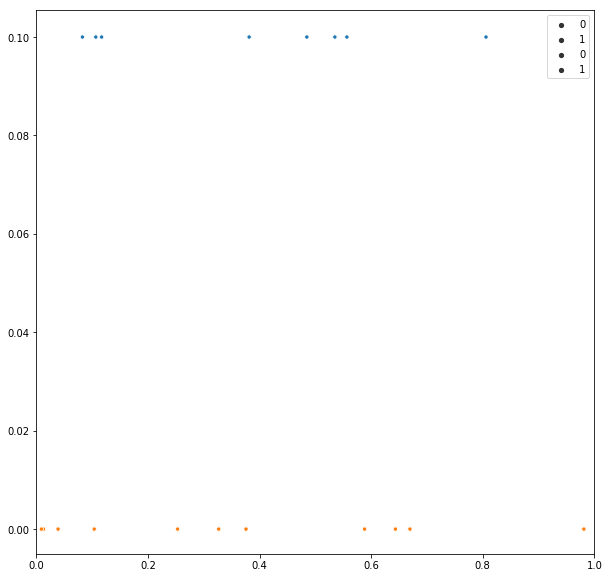

In [46]:
x1, x2 = s.test.y[s.test.bin_hat == 1][:,0], s.test.y[s.test.bin_hat == 0][:,0]

plt.figure(figsize=(10, 10))
axes = plt.gca()
axes.set_xlim([0,1])

sns.scatterplot(x1, np.zeros(x1.size)+.1, size=1)
sns.scatterplot(x2, np.zeros(x2.size), size=1)

plt.show()

# Classical Regression

## Data Extraction

In [47]:
s.validation.bin_hat = opt_model.classifier.predict(s.validation.Xflatten)
mask = s.validation.bin_hat
s_post_valid = SampleSubset(s.validation.bin[mask,:], s.validation.y[mask,:], s.validation.Xscalar[mask,:], s.validation.Xvec[mask,:,:],
                           Xflatten=s.validation.Xflatten[mask,:], Xboundary=s.validation.Xboundary)

mask = s.test.bin_hat
s_post_test = SampleSubset(s.test.bin[mask,:], s.test.y[mask,:], s.test.Xscalar[mask,:], s.test.Xvec[mask,:,:],
                          Xflatten=s.test.Xflatten[mask,:], Xboundary=s.test.Xboundary)

s_post = Sample(None, s_post_valid, s_post_test, scaler=s.scaler)

In [48]:
from classes import Regressor
sel_data = [s_post.validation.Xflatten, s_post.test.Xflatten,
            np.squeeze(s_post.validation.y), np.squeeze(s_post.test.y)]

In [49]:
[x.shape for x in sel_data]

[(139, 154), (44, 154), (139,), (44,)]

### Y Shift (+ve) for RMSLE

In [50]:
# shift all inputs for 
pos_shift = [-x.min() + 1 + np.finfo(np.float32).eps for x in sel_data[2:]] 
sel_pos_data = sel_data[:2] + [x + shift for x, shift in zip(sel_data[2:], pos_shift)]

## Common Regressors

### KNN

In [51]:
from utils_regressors import KNNReg
knn_reg = Regressor('KNN Regression', KNNReg(sel_pos_data))

0.06258095


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


### Linear Regression

### Support-vector Machine

### Random Forest

In [52]:
from utils_regressors import RFR
rfr = Regressor('Random Forest', RFR(sel_pos_data))

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.14538878232651672


### Bagging

In [53]:
from utils_regressors import BagReg
bag_reg = Regressor('Bagging', BagReg(sel_pos_data))

0.11704849787656614


## Performance

### Validation (fit) Error

In [54]:
models_reg = [knn_reg, rfr, bag_reg]
f = lambda i:models_reg[i].mse
opt_model_reg = models_reg[min(range(len(models_reg)), key=f)]
opt_model_reg.name

'KNN Regression'

In [55]:
s.validation.y_hat = opt_model_reg.regressor.predict(s.validation.Xflatten) - pos_shift[0]
labels = s.scaler.y.inverse_transform(s.validation.y)
outputs = s.scaler.y.inverse_transform(s.validation.y_hat)

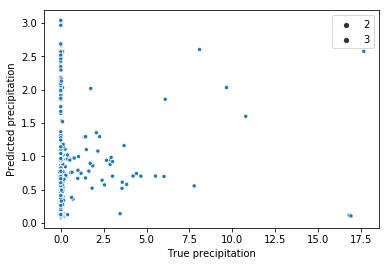

In [56]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()

### Test Error

In [57]:
s.test.y_hat = opt_model_reg.regressor.predict(s.test.Xflatten) - pos_shift[1]
labels = s.scaler.y.inverse_transform(s.test.y)
outputs = s.scaler.y.inverse_transform(s.test.y_hat)

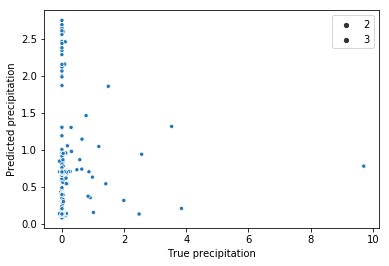

In [58]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()

# Convolutional Neural Net

In [59]:
print('1 class ratio after ADASYN= {:.2%}'.format(s_post.validation.class_ratio))
# ideally 100%

1 class ratio after ADASYN= 82.01%


## Network Construction

In [60]:
# Input placeholders
input_conv = Input(shape=s_post.validation.Xvec.shape[1:], name='column_input')
input_scalar = Input(shape=(s_post.validation.Xscalar.shape[1],), name='surface_input')

# Hidden layers
conv_1 = Conv1D(1, kernel_size=8)(input_conv)
bn_1 = BatchNormalization()(conv_1)
pool_1 = MaxPooling1D(pool_size=2)(bn_1)
act_1 = Activation('relu')(pool_1)

conv_2 = Conv1D(1, kernel_size=4)(act_1)
bn_2 = BatchNormalization()(conv_2)
pool_2 = MaxPooling1D(pool_size=2)(bn_2)
act_2 = Activation('relu')(pool_2)

flatten_2 = Flatten()(act_2)

layer = concatenate([flatten_2, input_scalar])
#layer = Dense(4, activation='relu')(layer)

hid_3 = Dense(2,
              activation='relu')(layer)
hid_3 = Dropout(0.1)(hid_3)

output = Dense(1,
               kernel_regularizer=regularizers.l2(0.02),
               name='output')(hid_3)

# 1. Initialize
model_reg = Model(inputs=[input_conv, input_scalar], outputs=output)
to_file_path = f'nn/model_r_{site.value}.png'
plot_model(model_reg, show_shapes=True, to_file=to_file_path)
print(model_reg.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
column_input (InputLayer)       (None, 37, 4)        0                                            
__________________________________________________________________________________________________
conv1d_3 (Conv1D)               (None, 30, 1)        33          column_input[0][0]               
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, 30, 1)        4           conv1d_3[0][0]                   
__________________________________________________________________________________________________
max_pooling1d_3 (MaxPooling1D)  (None, 15, 1)        0           batch_normalization_3[0][0]      
__________________________________________________________________________________________________
activation

## Network Training

In [61]:
# 2. Compile
model_reg.compile(optimizer=Adam(),
                  loss='mean_squared_logarithmic_error')

to_file_path = f'nn/best_model_r_{site.value}.h5'
callbacks = [EarlyStopping(monitor='loss',
                           min_delta=0,
                           patience=40,
                           verbose=0, mode='auto'),
             ModelCheckpoint(filepath=to_file_path, 
                             monitor='loss', 
                             save_best_only=True)]

In [62]:
# 3. Train
model_reg.fit([s_post.validation.Xvec, s_post.validation.Xscalar], s_post.validation.y,
          epochs=2000,
          callbacks=callbacks,
          verbose=2,
          batch_size=32, 
          validation_data=([s_post.test.Xvec, s_post.test.Xscalar], s_post.test.y)
         )

Train on 139 samples, validate on 44 samples
Epoch 1/2000
 - 1s - loss: 0.3605 - val_loss: 0.2043
Epoch 2/2000
 - 0s - loss: 0.3601 - val_loss: 0.2039
Epoch 3/2000
 - 0s - loss: 0.3597 - val_loss: 0.2035
Epoch 4/2000
 - 0s - loss: 0.3593 - val_loss: 0.2031
Epoch 5/2000
 - 0s - loss: 0.3589 - val_loss: 0.2027
Epoch 6/2000
 - 0s - loss: 0.3585 - val_loss: 0.2023
Epoch 7/2000
 - 0s - loss: 0.3581 - val_loss: 0.2019
Epoch 8/2000
 - 0s - loss: 0.3578 - val_loss: 0.2015
Epoch 9/2000
 - 0s - loss: 0.3574 - val_loss: 0.2012
Epoch 10/2000
 - 0s - loss: 0.3570 - val_loss: 0.2008
Epoch 11/2000
 - 0s - loss: 0.3566 - val_loss: 0.2004
Epoch 12/2000
 - 0s - loss: 0.3563 - val_loss: 0.2000
Epoch 13/2000
 - 0s - loss: 0.3559 - val_loss: 0.1997
Epoch 14/2000
 - 0s - loss: 0.3555 - val_loss: 0.1993
Epoch 15/2000
 - 0s - loss: 0.3551 - val_loss: 0.1989
Epoch 16/2000
 - 0s - loss: 0.3548 - val_loss: 0.1986
Epoch 17/2000
 - 0s - loss: 0.3544 - val_loss: 0.1982
Epoch 18/2000
 - 0s - loss: 0.3541 - val_loss:

Epoch 152/2000
 - 0s - loss: 0.3253 - val_loss: 0.1692
Epoch 153/2000
 - 0s - loss: 0.3251 - val_loss: 0.1691
Epoch 154/2000
 - 0s - loss: 0.3250 - val_loss: 0.1690
Epoch 155/2000
 - 0s - loss: 0.3249 - val_loss: 0.1689
Epoch 156/2000
 - 0s - loss: 0.3248 - val_loss: 0.1688
Epoch 157/2000
 - 0s - loss: 0.3247 - val_loss: 0.1686
Epoch 158/2000
 - 0s - loss: 0.3246 - val_loss: 0.1685
Epoch 159/2000
 - 0s - loss: 0.3245 - val_loss: 0.1684
Epoch 160/2000
 - 0s - loss: 0.3244 - val_loss: 0.1683
Epoch 161/2000
 - 0s - loss: 0.3243 - val_loss: 0.1682
Epoch 162/2000
 - 0s - loss: 0.3242 - val_loss: 0.1681
Epoch 163/2000
 - 0s - loss: 0.3241 - val_loss: 0.1680
Epoch 164/2000
 - 0s - loss: 0.3240 - val_loss: 0.1679
Epoch 165/2000
 - 0s - loss: 0.3238 - val_loss: 0.1678
Epoch 166/2000
 - 0s - loss: 0.3237 - val_loss: 0.1677
Epoch 167/2000
 - 0s - loss: 0.3236 - val_loss: 0.1676
Epoch 168/2000
 - 0s - loss: 0.3235 - val_loss: 0.1675
Epoch 169/2000
 - 0s - loss: 0.3234 - val_loss: 0.1674
Epoch 170/

Epoch 301/2000
 - 0s - loss: 0.3160 - val_loss: 0.1600
Epoch 302/2000
 - 0s - loss: 0.3160 - val_loss: 0.1600
Epoch 303/2000
 - 0s - loss: 0.3159 - val_loss: 0.1599
Epoch 304/2000
 - 0s - loss: 0.3159 - val_loss: 0.1599
Epoch 305/2000
 - 0s - loss: 0.3159 - val_loss: 0.1599
Epoch 306/2000
 - 0s - loss: 0.3159 - val_loss: 0.1599
Epoch 307/2000
 - 0s - loss: 0.3158 - val_loss: 0.1598
Epoch 308/2000
 - 0s - loss: 0.3158 - val_loss: 0.1598
Epoch 309/2000
 - 0s - loss: 0.3158 - val_loss: 0.1598
Epoch 310/2000
 - 0s - loss: 0.3158 - val_loss: 0.1598
Epoch 311/2000
 - 0s - loss: 0.3157 - val_loss: 0.1597
Epoch 312/2000
 - 0s - loss: 0.3157 - val_loss: 0.1597
Epoch 313/2000
 - 0s - loss: 0.3157 - val_loss: 0.1597
Epoch 314/2000
 - 0s - loss: 0.3157 - val_loss: 0.1597
Epoch 315/2000
 - 0s - loss: 0.3156 - val_loss: 0.1597
Epoch 316/2000
 - 0s - loss: 0.3156 - val_loss: 0.1596
Epoch 317/2000
 - 0s - loss: 0.3156 - val_loss: 0.1596
Epoch 318/2000
 - 0s - loss: 0.3156 - val_loss: 0.1596
Epoch 319/

Epoch 450/2000
 - 0s - loss: 0.3143 - val_loss: 0.1583
Epoch 451/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 452/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 453/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 454/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 455/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 456/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 457/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 458/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 459/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 460/2000
 - 0s - loss: 0.3142 - val_loss: 0.1583
Epoch 461/2000
 - 0s - loss: 0.3142 - val_loss: 0.1582
Epoch 462/2000
 - 0s - loss: 0.3142 - val_loss: 0.1582
Epoch 463/2000
 - 0s - loss: 0.3142 - val_loss: 0.1582
Epoch 464/2000
 - 0s - loss: 0.3142 - val_loss: 0.1582
Epoch 465/2000
 - 0s - loss: 0.3142 - val_loss: 0.1582
Epoch 466/2000
 - 0s - loss: 0.3142 - val_loss: 0.1582
Epoch 467/2000
 - 0s - loss: 0.3142 - val_loss: 0.1582
Epoch 468/

Epoch 599/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 600/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 601/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 602/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 603/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 604/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 605/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 606/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 607/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 608/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 609/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 610/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 611/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 612/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 613/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 614/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 615/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 616/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 617/

Epoch 748/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 749/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 750/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 751/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 752/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 753/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 754/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 755/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 756/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 757/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 758/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 759/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 760/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 761/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 762/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 763/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 764/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 765/2000
 - 0s - loss: 0.3141 - val_loss: 0.1581
Epoch 766/

## Testing

### Validation Error

In [63]:
s_post.validation.y_hat = model_reg.predict([s_post.validation.Xvec, s_post.validation.Xscalar])
labels = s.scaler.y.inverse_transform(s_post.validation.y)
outputs = s.scaler.y.inverse_transform(s_post.validation.y_hat)

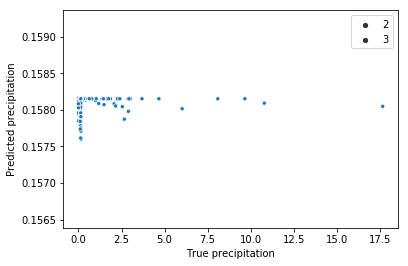

In [64]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()

### Test Error

In [65]:
s_post.test.y_hat = model_reg.predict([s_post.test.Xvec, s_post.test.Xscalar])
labels = s.scaler.y.inverse_transform(s_post.test.y)
outputs = s.scaler.y.inverse_transform(s_post.test.y_hat)

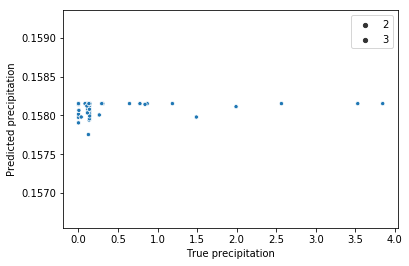

In [66]:
sns.scatterplot(np.squeeze(labels), np.squeeze(outputs), size=3)
plt.xlabel('True precipitation')
plt.ylabel('Predicted precipitation')
plt.show()